In [2]:
# ==========================================
# CODE 4 / NOTEBOOK 4
# GEOGRAPHY
# ==========================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium.plugins import MarkerCluster, HeatMap

pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 200)

sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)

In [3]:
# -----------------------------
# 1. LOAD CLEANED DATA
# -----------------------------
df = pd.read_csv("occurrences_cleaned.csv")
df.head()

,occurrence_id,local_date_main_event,date_main_event_unconfirmed,year_reported,occurrence_severity,main_event_l1,main_event_l2,main_event_l3,not_vessel_operations,short_description,description,national_keywords,emcip_keywords,sar_intervention,state_reporting,occurrence_location,coastal_state_affected,national_location_l1,national_location_l2,latitude,longitude,lat_long_unknown,port_of_accident_l1,port_of_accident_l2,natural_light,sea_state,visibility,weather,wind_force,publication_date,publication_no,publication_type,published_report_website_link,occurrence_record_modified_on,last_updated_at,occurrences_reported_from,occurrences_reported_to
0,1f59ae23-e48f-ec11-b400-000d3a874c7b,2022-02-01,No,2022,Marine Incident,Contact,Shore Object,NaN,False,A ro-ro cargo vessel made contact with quay side,A ro-ro cargo vessel was manoeuvring to line up to enter a lock when the vessel made contact with the eastern approach causing damage to at least two fenders. A tug was assisting the vessel.,NaN,NaN,No,UK,Internal waters -> Port area,UNITED KINGDOM,United Kingdom,England,53.6383,-0.199300,NaN,UNITED KINGDOM,Immingham,Unknown,Unknown,Unknown,Unknown,Beaufort scale: Unknown,NaN,NaN,NaN,NaN,2026-01-29,2026-05-15,2020-01-01,2025-12-31
1,c51366b7-39cd-ec11-a7b6-0022481a81f8,2022-04-01,No,2022,Marine Incident,Damage / Loss Of Equipment,NaN,NaN,False,A service vessel drifted from a quayside resulting in a gangway falling into the water,A service vessel entered a port through lock gates and came alongside with a tie up of a breast line forward and aft. A gangway was then deployed. The vessel started to drift astern with the bow c...,NaN,NaN,No,UK,Internal waters -> Port area,UNITED KINGDOM,United Kingdom,Scotland,55.9869,-3.176900,NaN,UNITED KINGDOM,Leith,Daylight,1 - Calm rippled - (0 - 0.1 m),Good - 5.0 <= Vis < 25.0 nm,Clear,4 - Moderate Breeze - knot (11-16) m/s (6-8),NaN,NaN,NaN,NaN,2025-03-28,2026-05-15,2020-01-01,2025-12-31
2,883d7a39-90e1-ec11-bb3d-000d3a0cda10,2022-05-01,No,2022,Marine Incident,Accident to person(s),NaN,NaN,False,A inland passenger vessel passenger fell down stairs resulting in a head laceration,An inland waterways passenger vessel passenger fell whilst onboard resulting in a head injury. The passenger refused assistance from an ambulance and made their own way to hospital.,NaN,NaN,No,UK,Inland waters -> River,UNITED KINGDOM,United Kingdom,England,51.5074,-0.082500,NaN,NaN,NaN,Unknown,Unknown,Unknown,Unknown,Beaufort scale: Unknown,NaN,NaN,NaN,NaN,2026-03-13,2026-05-15,2020-01-01,2025-12-31
3,68afeb11-12ee-ec11-bb3c-000d3a0d2897,2022-06-01,No,2022,Marine Incident,Loss Of Control,Loss Of Propulsion Power,NaN,False,Fishing vessel's gearbox failed resulting in a tow.,Fishing vessel's gearbox failed resulting in a tow from another fishing vessel. The casualty vessel was not in danger at any point.,NaN,NaN,No,UK,Open sea -> Within EEZ,None/Register withdrawn,NaN,NaN,50.0644,-3.417183,NaN,NaN,NaN,Daylight,Unknown,Unknown,Unknown,Beaufort scale: Unknown,NaN,NaN,NaN,NaN,2026-01-29,2026-05-15,2020-01-01,2025-12-31
4,d40d9f19-bd0c-ed11-b83d-0022481b1890,2022-07-01,No,2022,Less Serious,Accident to person(s),NaN,NaN,False,A sailing yacht crew member sustained a partial amputation to two fingers,"A sailing yacht was seeking shelter as the wind was due, the crew set about stowing the sails. The furling gear had loosened, a crew member went forward to furl the genoa. As they rotated the furl...",NaN,NaN,Yes,UK,Coastal waters <= 12 nm,UNITED KINGDOM,United Kingdom,Scotland,56.2847,-6.243700,NaN,NaN,NaN,Daylight,Unknown,Unknown,Unknown,Beaufort scale: Unknown,NaN,NaN,NaN,NaN,2026-02-23,2026-05-15,2020-01-01,2025-12-31


In [4]:
# -----------------------------
# 2. BASIC PREPARATION
# -----------------------------
df.columns = df.columns.str.strip().str.lower()

df["local_date_main_event"] = pd.to_datetime(df["local_date_main_event"], errors="coerce")
df["event_year"] = df["local_date_main_event"].dt.year

text_cols = [
    "occurrence_severity",
    "main_event_l1",
    "occurrence_location",
    "coastal_state_affected",
    "national_location_l1",
    "national_location_l2",
    "port_of_accident_l1",
    "port_of_accident_l2",
    "short_description"
]

for col in text_cols:
    if col in df.columns:
        df[col] = df[col].astype("string").str.strip()

df["latitude"] = pd.to_numeric(df["latitude"], errors="coerce")
df["longitude"] = pd.to_numeric(df["longitude"], errors="coerce")

print("Dataset shape:", df.shape)
print(df[["latitude", "longitude"]].describe())

Dataset shape: (8599, 38)
          latitude    longitude
count  8598.000000  8598.000000
mean     49.103023     0.699333
std      16.061955    34.393050
min     -63.053333  -178.415000
25%      50.757917    -4.508317
50%      51.703992    -1.909850
75%      54.482408     0.133400
max      78.400000   179.700000


In [6]:
# -----------------------------
# 3. CLEAN GEOGRAPHY FIELDS
# -----------------------------
def clean_geo_category(series):
    s = series.astype("string").str.strip()
    s = s.replace({
        "<NA>": pd.NA,
        "NA": pd.NA,
        "N/A": pd.NA,
        "nan": pd.NA,
        "None": pd.NA,
        "": pd.NA,
        "None/Register withdrawn": "Unknown"
    })
    return s.fillna("Unknown")

df["occurrence_location_plot"] = clean_geo_category(df["occurrence_location"])
df["country_plot"] = clean_geo_category(df["national_location_l1"])
df["region_plot"] = clean_geo_category(df["national_location_l2"])
df["coastal_state_plot"] = clean_geo_category(df["coastal_state_affected"])
df["port_plot"] = clean_geo_category(df["port_of_accident_l2"])
df["severity_plot"] = clean_geo_category(df["occurrence_severity"])
df["event_plot"] = clean_geo_category(df["main_event_l1"])

In [7]:
# -----------------------------
# 4. VALID COORDINATES FILTER
# -----------------------------
geo_df = df.copy()

geo_df = geo_df[
    geo_df["latitude"].between(-90, 90, inclusive="both") &
    geo_df["longitude"].between(-180, 180, inclusive="both")
].copy()

print("Total records:", len(df))
print("Records with valid coordinates:", len(geo_df))
print("Coverage %:", round((len(geo_df) / len(df)) * 100, 2))

Total records: 8599
Records with valid coordinates: 8598
Coverage %: 99.99


In [8]:
# -----------------------------
# 5. GEOGRAPHIC DISTRIBUTIONS
# -----------------------------
location_counts = df["occurrence_location_plot"].value_counts().reset_index()
location_counts.columns = ["occurrence_location", "count"]
location_counts["pct"] = (location_counts["count"] / len(df)) * 100

region_counts = df["region_plot"].value_counts().reset_index()
region_counts.columns = ["region", "count"]
region_counts["pct"] = (region_counts["count"] / len(df)) * 100

port_counts = df["port_plot"].value_counts().reset_index()
port_counts.columns = ["port", "count"]
port_counts["pct"] = (port_counts["count"] / len(df)) * 100

print("\n===== OCCURRENCE LOCATION DISTRIBUTION =====")
print(location_counts.head(10))

print("\n===== TOP REGIONS =====")
print(region_counts.head(10))

print("\n===== TOP PORTS =====")
print(port_counts.head(10))


===== OCCURRENCE LOCATION DISTRIBUTION =====
                      occurrence_location  count        pct
0                 Coastal waters <= 12 nm   3807   44.27259
1            Internal waters -> Port area   3356  39.027794
2                  Open sea -> Within EEZ    578   6.721712
3                  Inland waters -> River    381   4.430748
4                 Open sea -> Outside EEZ    184   2.139784
5       Internal waters -> Channel, river    155   1.802535
6                   Inland waters -> Lake     65   0.755902
7                Inland waters -> Channel     32   0.372136
8                           Inland waters     31   0.360507
9  Internal waters -> Archipelago fairway      8   0.093034

===== TOP REGIONS =====
             region  count        pct
0           England   4942  57.471799
1           Unknown   1432  16.653099
2          Scotland   1331  15.478544
3             Wales    658   7.652053
4  Northern Ireland    236   2.744505

===== TOP PORTS =====
            port  

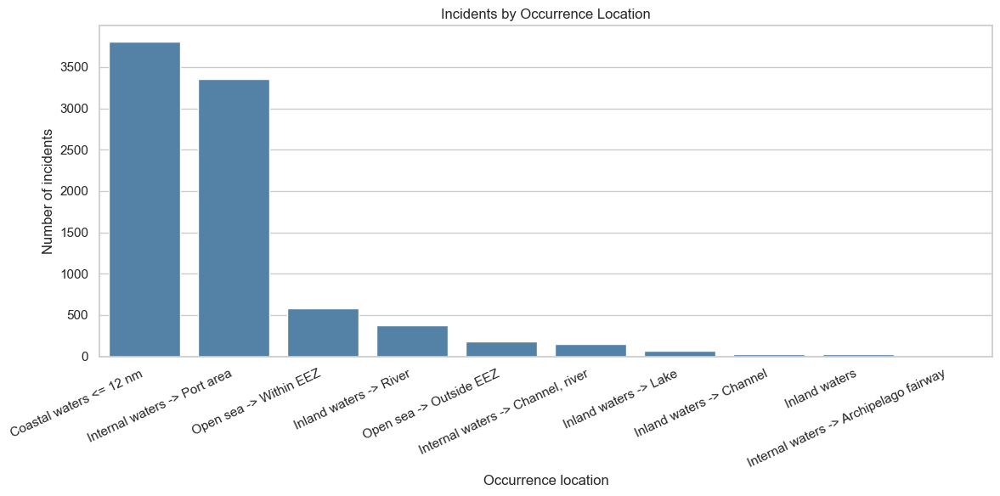

In [9]:
# -----------------------------
# 6. PLOT: INCIDENTS BY LOCATION TYPE
# -----------------------------
plt.figure(figsize=(12, 6))
sns.barplot(
    data=location_counts.head(10),
    x="occurrence_location",
    y="count",
    color="steelblue"
)
plt.title("Incidents by Occurrence Location")
plt.xlabel("Occurrence location")
plt.ylabel("Number of incidents")
plt.xticks(rotation=25, ha="right")
plt.tight_layout()
plt.show()

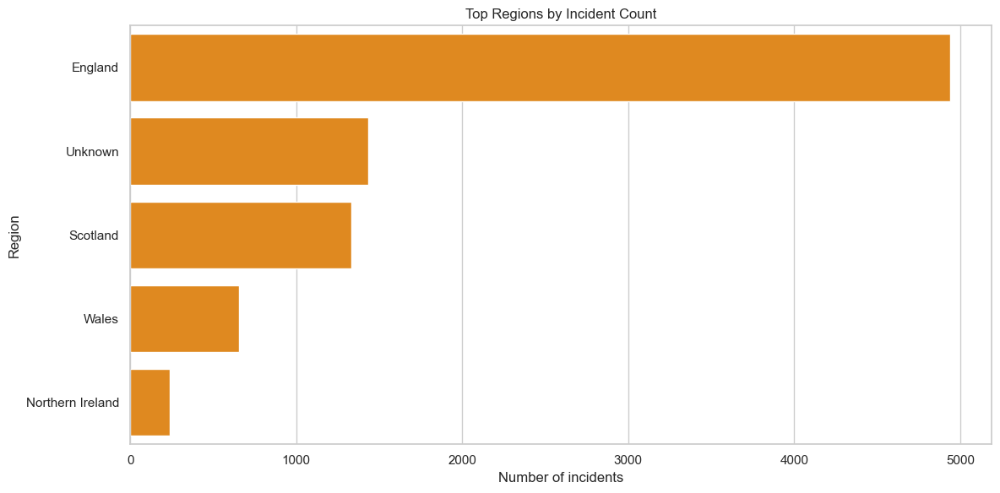

In [10]:
# -----------------------------
# 7. PLOT: TOP REGIONS
# -----------------------------
top_regions = region_counts.head(10)

plt.figure(figsize=(12, 6))
sns.barplot(
    data=top_regions,
    y="region",
    x="count",
    color="darkorange"
)
plt.title("Top Regions by Incident Count")
plt.xlabel("Number of incidents")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

In [11]:
# -----------------------------
# 8. MAP DATA PREPARATION
# -----------------------------
map_df = geo_df[
    [
        "occurrence_id",
        "local_date_main_event",
        "event_year",
        "latitude",
        "longitude",
        "severity_plot",
        "event_plot",
        "occurrence_location_plot",
        "country_plot",
        "region_plot",
        "port_plot",
        "short_description"
    ]
].copy()

map_df["date_str"] = map_df["local_date_main_event"].dt.strftime("%Y-%m-%d")

def severity_color(sev):
    sev = str(sev)
    if sev == "Very Serious":
        return "darkred"
    elif sev == "Serious":
        return "red"
    elif sev == "Less Serious":
        return "orange"
    elif sev == "Marine Incident":
        return "blue"
    else:
        return "gray"

map_df["marker_color"] = map_df["severity_plot"].apply(severity_color)

print(map_df.head())
print("Map rows:", len(map_df))

                          occurrence_id local_date_main_event  event_year  \
0  1f59ae23-e48f-ec11-b400-000d3a874c7b            2022-02-01        2022   
1  c51366b7-39cd-ec11-a7b6-0022481a81f8            2022-04-01        2022   
2  883d7a39-90e1-ec11-bb3d-000d3a0cda10            2022-05-01        2022   
3  68afeb11-12ee-ec11-bb3c-000d3a0d2897            2022-06-01        2022   
4  d40d9f19-bd0c-ed11-b83d-0022481b1890            2022-07-01        2022   

   latitude  longitude    severity_plot                  event_plot  \
0   53.6383  -0.199300  Marine Incident                     Contact   
1   55.9869  -3.176900  Marine Incident  Damage / Loss Of Equipment   
2   51.5074  -0.082500  Marine Incident       Accident to person(s)   
3   50.0644  -3.417183  Marine Incident             Loss Of Control   
4   56.2847  -6.243700     Less Serious       Accident to person(s)   

       occurrence_location_plot    country_plot region_plot  port_plot  \
0  Internal waters -> Port area  Uni

In [12]:
# -----------------------------
# 9. BUILD INTERACTIVE MAP
# -----------------------------
map_center = [map_df["latitude"].mean(), map_df["longitude"].mean()]

m = folium.Map(
    location=map_center,
    zoom_start=5,
    tiles="CartoDB positron"
)

marker_cluster = MarkerCluster(name="Incident markers").add_to(m)

for _, row in map_df.iterrows():
    popup_html = f"""
    <b>Date:</b> {row['date_str']}<br>
    <b>Severity:</b> {row['severity_plot']}<br>
    <b>Main event:</b> {row['event_plot']}<br>
    <b>Location type:</b> {row['occurrence_location_plot']}<br>
    <b>Country:</b> {row['country_plot']}<br>
    <b>Region:</b> {row['region_plot']}<br>
    <b>Port:</b> {row['port_plot']}<br>
    <b>Description:</b> {row['short_description']}
    """

    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color=row["marker_color"],
        fill=True,
        fill_color=row["marker_color"],
        fill_opacity=0.7,
        weight=1,
        popup=folium.Popup(popup_html, max_width=350)
    ).add_to(marker_cluster)

In [13]:
# -----------------------------
# 10. ADD HEATMAP OVERLAY
# -----------------------------
heat_data = map_df[["latitude", "longitude"]].dropna().values.tolist()

HeatMap(
    heat_data,
    name="Incident heatmap",
    radius=10,
    blur=8,
    min_opacity=0.35
).add_to(m)

In [14]:
# -----------------------------
# 11. ADD LAYER CONTROL + SAVE
# -----------------------------
folium.LayerControl().add_to(m)

m.save("geography_interactive_map.html")

print("Interactive map saved as geography_interactive_map.html")
m

Interactive map saved as geography_interactive_map.html
